In [1]:
import numpy as np # Import Numpy library to process big data
import pandas as pd # Import Pandas library to work with files
import seaborn as sns # Import Seaborn library as an addition for Matpotlib
import plotly.express as px # Import Plotly.express module to generate figures rapidly

sns.set(style='whitegrid', font_scale=1.3, palette='Set2') # Set a style, fontsize and pallete for the graphs

In [7]:
business_df: pd.DataFrame = pd.read_csv("yelp_business.csv", index_col=0) # Read data from the file by columns
businessLV_df: pd.DataFrame = business_df[business_df["city"] == "Las Vegas"] # Filter data so it refers to Las Vegas
# Set the borders of Las Vegas
businessLV_df = businessLV_df[(businessLV_df["longitude"] > -115.387)  & (businessLV_df["longitude"] < -114.99)  &
                              (businessLV_df["latitude"] > 35.933) & (businessLV_df["latitude"] < 36.357)]    
# Perlace missing values in the "neighborhood" column with the string "Unknown"
businessLV_df.loc[:,"neighborhood"].fillna("Unknown", inplace=True)

#### 2. Оценки компаний

Проанализируем датасет из таблицы оценок `yelp_review.csv`. Как понятно из названия, он содержит отзывы посетителей о разных заведениях, выраженные в их оценках (с целью сокращения размера датасета текстовые отзывы клиентов из него удалены).

In [8]:
review_df: pd.DataFrame = pd.read_csv("yelp_review.csv", index_col=0) # Read data from the file by columns
review_df.sample(10) # View 10 random lines from the file

,business_id,stars
812161,yU34swtpTS8-SMjeLIEFcQ,1
4936890,AH-plSKfFJTjLF_QKen5fw,5
4199401,tZnSodhPwNr4bzrwJ1CSbw,2
5197336,hmgbkFngXKjpWqJItOPYpA,2
2922733,p-hbSPw3goKbw4Y581UOjg,1
338732,l4pAkHCVUKAcDvo-iNSbYA,2
727424,8qAtou9A4ksXGkjyLibWDg,5
4267154,5EJdDudgYO2apB3Kl_TMWQ,1
3999706,FbMZ0N5iAicep5ssYLZB9w,5
768358,OETh78qcgDltvHULowwhJg,5


В подгруженной таблице оценок нам нужны компании в `Las Vegas`. Как можно заметить, 'business_id' в двух датасетах связаны друг с другом, и благодаря ним можно оставить только те компании, которые находятся в искомом городе.

In [9]:
review_df.set_index("business_id", inplace=True) # Set the index, which will serve as the new index column
business_ids = businessLV_df["business_id"].tolist() # Create a list by extracting the "business_id" column 
review_df = review_df.loc[review_df.index.isin(business_ids)] # Filter the data to include only rows whose index is present
review_df.reset_index(inplace=True) # Reset the index to its default value
review_df.sample(10) # Show 10 random lines from the file

,business_id,stars
1145249,ZAuAwz1ijuydn5yL3q3rzA,4
585656,9cw870n3gsGikVoOT5YOYg,4
847173,kJAmLFgiIjtjULunpr3NNg,3
1206834,Pob7ibbNT29--69nxXEP2g,3
1012065,5ma1OUQWy_Ds80xUiP7JPQ,4
1270731,vUJdxpjbcI-1esW2QFHSCA,3
1006380,YhCAJ8acd1X7GkCHPhD8Xw,4
801988,MTtI2bqoNHN_0m2cHbY2ug,2
1471825,O3OH5IEFMPtz7mPKakPZ3Q,3
1055320,8J4oT58-Nc-q1bpF9CRTpw,1


Теперь посчитаем важные метрики для компаний: их средние оценки и общее количество оценок.

In [10]:
review_df = review_df.groupby(["business_id"]).aggregate(["mean", "size"]) # Group and aggregate data across columns

In [11]:
review_df.columns = ["average_rating", "number_of_reviews"] # Filter data showing only neccessary columns
review_df.head(10) # Show first 10 lines

,average_rating,number_of_reviews
business_id,,
--9e1ONYQuAa-CB_Rrw7Tw,4.088904,1451
--DdmeR16TRb3LsjG0ejrQ,3.200000,5
--WsruI0IGEoeRmkErU5Gg,4.928571,14
--Y7NhBKzLTbNliMUX_wfg,4.875000,8
--e8PjCNhEz32pprnPhCwQ,3.473684,19
--o5BoU7qYMALeVDK6mwVg,3.500000,6
--q7kSBRb0vWC8lSkXFByA,4.000000,7
--z7PM8AGaJP0aBmGMY7RA,4.722222,18
-0BxAGlIk5DJAGVkpqBXxg,2.900000,40


Теперь соединим две полученнные таблицы: 'review_df' и 'LV_business_df'.

In [12]:
businessLV_df.set_index("business_id", inplace=True) # Set the index, which will serve as the new index column

In [13]:
businessLV_df = businessLV_df.join(review_df, on="business_id") # Join table by a specific column

Изобразим все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки возьмем за $0.3$ для лучшей визуализации.

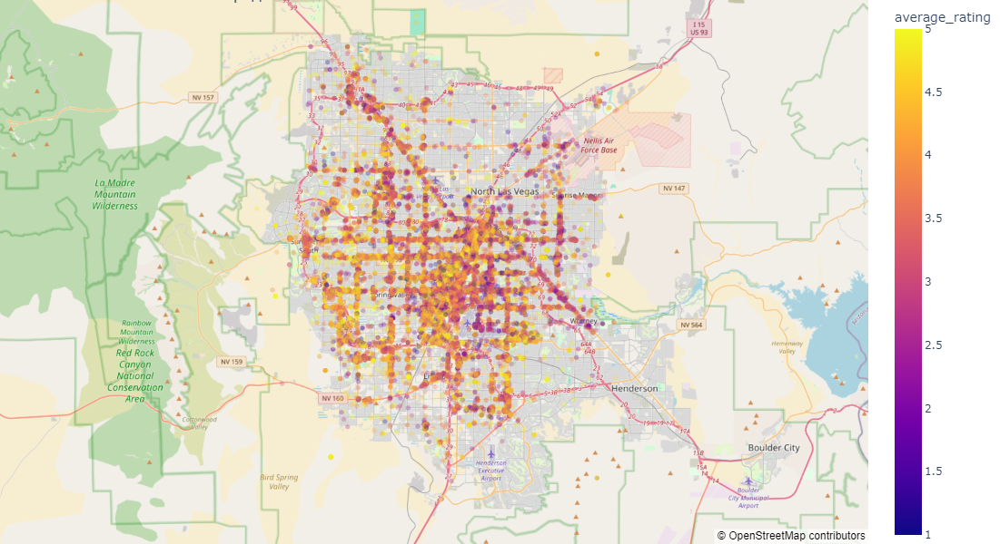

In [15]:
fig = px.scatter_mapbox(data_frame=businessLV_df,                          # Visualize data points on a map using latitude and longitude
                        lat="latitude",                                    # Set latitude
                        lon="longitude",                                   # Set longitude
                        hover_name="name",                                 # Set which column is displayed in bold as the tooltip title
                        hover_data=["address", "neighborhood", "is_open"], # Set the column names shown in the hover tooltip
                        color = "average_rating",                          # Classify colors by unique values
                        zoom=9.5,                                          # Zoom the map
                        width=800,                                         # Set the map's width
                        height=600,                                        # Set the map's height
                        opacity=0.3,                                       # Set the points' transperancy
                        title="Рейтинг компаний в городе N")               # Set the map's title
fig.update_layout(mapbox_style="open-street-map")                          # Set the map's appereance 
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})                        # Set the map's margins 
fig.write_html("Vegas companies by rating.html")                           # Write the figure to an HTML-file
fig.show()                                                                 # Show the map

#### 3. Рестораны

Попробуем выделить из всех коммерческих компаний только предприятия общственного питания. Как можно было заметить в первом датасете, в категории может быть одновременно несколько специализаций заведения, поэтому, чтобы выделить рестораны, воспользуемся поиском паттерна restaurant в lowercase-написании текста из ячейки 'categories'. Также оставим только те рестораны, у которых хотя бы 5 отзывов.

In [16]:
# Filter data by choosing only catering with at least 5 reviews
businessLV_restaurants: pd.DataFrame = businessLV_df[(businessLV_df["categories"].apply(lambda x: "restaurant" in x.lower())) & (businessLV_df["number_of_reviews"] >= 5)]
businessLV_restaurants.sample(10) # Show 10 random lines

,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories,average_rating,number_of_reviews
business_id,,,,,,,,,,,,
HZRT8xygRscGvDYYx2EkQQ,"""Ori'Zaba's Scratch Mexican Grill""",Eastside,"""3318 E Flamingo Rd""",Las Vegas,NV,89121,36.115599,-115.102283,1,Breakfast & Brunch;Tacos;Salad;Restaurants;Mex...,3.948454,97
YCEZLECK9IToE8Mysorbhw,"""Daily Kitchen Modern Eatery and Rotisserie""",South Summerlin,"""3645 S Town Center Dr, Ste 102""",Las Vegas,NV,89135,36.124269,-115.325410,1,Restaurants;American (New);Breakfast & Brunch,3.728205,195
w4yq1IRk0DHQE995giqjGg,"""Olive Garden Italian Restaurant""",University,"""1545 Flamingo Rd""",Las Vegas,NV,89119,36.114047,-115.132257,1,Italian;Salad;Restaurants;Bars;Nightlife;Wine ...,3.543956,182
grf5Gmn_GAh8ImHTi3HLPg,"""Pizza Hut""",Southwest,"""10520 Southern Highlands Pkwy""",Las Vegas,NV,89141,35.998163,-115.206655,1,Chicken Wings;Italian;Restaurants;Pizza,2.666667,39
LwXo16VrGPhhOWc_Wj7ifw,"""OM Restaurant""",Southeast,"""9400 S Eastern Ave, 106A""",Las Vegas,NV,89123,36.018131,-115.118054,0,Restaurants;Indian;Himalayan/Nepalese,4.094340,53
fL-b760btOaGa85OJ9ut3w,"""Rollin Smoke Barbeque""",Unknown,"""3185 S Highland Dr, Ste 2""",Las Vegas,NV,89109,36.132188,-115.177096,1,Restaurants;Soul Food;Burgers;Barbeque,4.388793,2320
-BmqghX1sv7sgsxOIS2yAg,"""Merkato Ethiopian Cafe""",Eastside,"""855 E Twain Ave, Ste 111""",Las Vegas,NV,89169,36.121647,-115.144848,0,Cafes;Vegetarian;Restaurants;Ethiopian,3.951613,186
8olG8J91NG_QU92WHG5QfA,"""Amore Taste of Chicago""",Spring Valley,"""3945 S Durango Dr""",Las Vegas,NV,89147,36.119112,-115.279733,1,Italian;Restaurants;Pizza,3.865478,617
aoXb8mDCyb-XbkITiIfYVA,"""Sbarro""",The Strip,"""3645 Las Vegas Blvd S""",Las Vegas,NV,89109,36.113881,-115.168983,1,Pizza;Salad;Restaurants;Italian,2.525000,40


Теперь среди заведений Лас-Вегаса оставим только самые популярные: те, у кого не менее 50 отзывов. Также отсортируем их по рейтингу и оставим только нужные колонки.

In [17]:
# Filter data by the most popular restaurants (with at least 50 reviews) and sort it
businessLV_restaurants_elite: pd.DataFrame = businessLV_restaurants[businessLV_restaurants["number_of_reviews"] >= 50].sort_values(by="average_rating", ascending=False).loc[:,["name", "average_rating","number_of_reviews", "latitude", "longitude", "categories"]]
businessLV_restaurants_elite.head(10) # Show first 10 lines

,name,average_rating,number_of_reviews,latitude,longitude,categories
business_id,,,,,,
iBPyahdJRP5y0t25fF2W9w,"""Lip Smacking Foodie Tours""",4.966480,179,36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...
Fmij544FE1iOruoxI41kew,"""Pepito Shack""",4.907692,65,36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...
qw9SyduMZ53KB6GlBQqvZQ,"""Bosa Boba Cafe""",4.890909,55,36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...
k9b96JXlNewj36ddrce9Jw,"""Garden Grill""",4.868132,91,36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...
IhNASEZ3XnBHmuuVnWdIwA,"""Brew Tea Bar""",4.848069,1165,36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...
k5ddmLvAKKw9zSusRPM2cQ,"""Poppa Naps BBQ""",4.836538,104,36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...
8fFTJBh0RB2EKG53ibiBKw,"""Zenaida's Cafe""",4.833333,180,36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes
l1GJnB9TJgGgEeI4at1M0A,"""El Frescos Cocina Mexicana""",4.816754,191,36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...
hFT3HuxVZJb1uYEsYfp-0A,"""Blaqcat Ultra Hookah Lounge""",4.809524,63,36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...


Нанесём на карту все рестораны со средней оценкой не менее $4.7$, а также выделим отдельным цветом 10 ресторанов с наивысшей средней оценкой.

In [18]:
# Filter data by reviews' values
businessLV_restaurants_elite = businessLV_restaurants_elite[businessLV_restaurants_elite["average_rating"] >= 4.7]
# Round the data to one decimal place
businessLV_restaurants_elite.loc[:, "average_rating"] = businessLV_restaurants_elite["average_rating"].apply(lambda x: np.round(x, decimals=1))
# Create a new column and set its values
businessLV_restaurants_elite.loc[:,"top10"] = "No"
# Set the value for the first 10 rows
businessLV_restaurants_elite.iloc[:10,:].loc[:,"top10"] = "Yes"

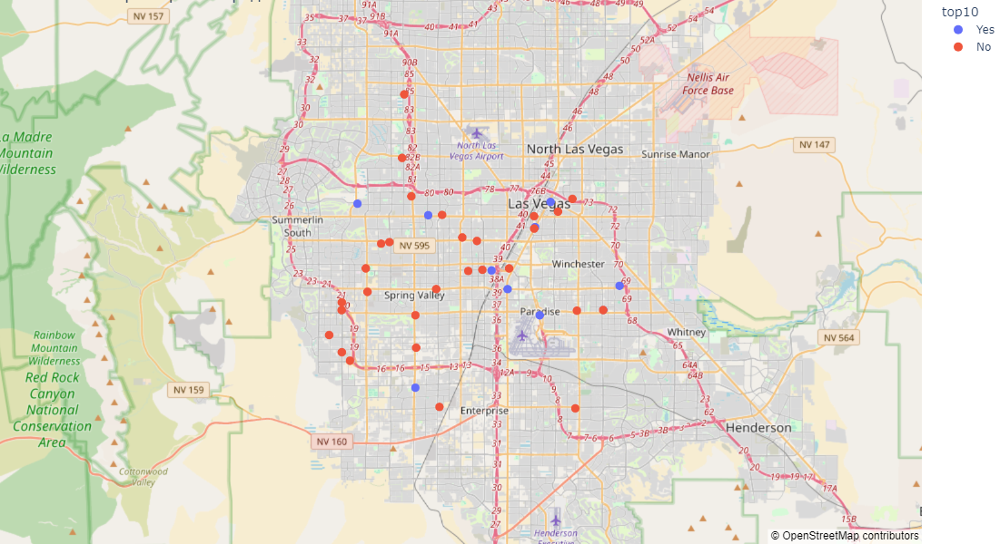

In [19]:
fig = px.scatter_mapbox(data_frame=businessLV_restaurants_elite,                           # Visualize data points on a map using latitude and longitude
                        lat="latitude",                                                    # Set the latitude
                        lon="longitude",                                                   # Set the longitude
                        hover_name="name",                                                 # Set which column is displayed in bold as the tooltip title
                        hover_data=["categories", "number_of_reviews", "average_rating"],  # Set the column names shown in the hover tooltip
                        color = "top10",                                                   # Classify colors by unique values
                        zoom=10,                                                           # Zoom the map
                        height=600,                                                        # Set the map's height
                        width=800,                                                         # Set the map's width
                        title="Элитные рестораны города N")                                # Set the map's title
fig.update_layout(mapbox_style="open-street-map")                                          # Set the map's appereance 
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})                                        # Set the map's margins 
fig.update_traces(marker=dict(size=10))                                                    # Set the color for 10 best restaurants
fig.write_html("Vegas elite restaurants.html")                                             # Write the figure to an HTML-file
fig.show()                                                                                 # Show the map

#### Вот и все! Теперь мы знаем, что данные могут обманывать и где поесть в Лас-Вегасе! Спасибо за внимание!